In [698]:
import sys
import os

sys.path.append('/Users/benny/Repos/octagon_analysis')

In [699]:
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import globals

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [700]:
from pathlib import Path
filepath = Path("/Users/benny/Documents/swc/trait_analyses/trait_dataframes/df.csv")
values_filepath = Path("/Users/benny/Documents/swc/trait_analyses/trait_dataframes/raw_values_df.csv")

In [701]:
trait_df = pd.read_csv(filepath, index_col=0)

In [702]:
values_df = pd.read_csv(values_filepath, index_col = 0)

In [703]:
trait_df

,date,Session identifier,GAD_total,AQ_total,BIS_total,opponent,proportion_score,proportion_wins,scores_per_unit_time_socials,scores_per_unit_time_solos,slice_onset_centrality_social,slice_onset_centrality_solo,slice_onset_centrality_first_solo,slice_onset_centrality_second_solo
pseudonym,,,,,,,,,,,,,,
EN27,2024-09-27,2024-09-27_Session1_Guest_Emily,7.0,5.0,23.0,SH27,0.625615764,0.615384615,8.431171435,4.691789369,0.656107888,0.686288346,0.672549608,0.700027084
SH27,2024-09-27,2024-09-27_Session1_Host_Sara,1.0,9.0,15.0,EN27,0.374384236,0.384615385,5.045425426,4.853477859,0.757651756,0.730982433,0.716209177,0.745755689
AW17,2024-10-17,2024-10-17_Session1_Guest_Abigail,5.0,9.0,11.0,SP17,0.579908676,0.603603604,7.464550731,5.108391665,0.671235982,0.698694795,0.646490261,0.750899330
SP17,2024-10-17,2024-10-17_Session1_Host_Shameer,1.0,1.0,15.0,AW17,0.420091324,0.396396396,5.407391081,3.647107819,0.454723055,0.390837698,0.340965825,0.440709571
FA12,2024-11-12,2024-11-12_Session2_Host_Francesca,1.0,0.0,10.0,SL12,0.793991416,0.729508197,10.612635921,6.830633950,0.710813076,0.518371221,0.270421505,0.766320938
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MI27,2026-03-27,2026-03-27_Session1_Host_Mariam,1.0,1.0,22.0,YZ27,0.579964851,0.558620690,10.743446498,7.123254635,0.710401107,0.688826711,0.706157598,0.671495825
RW27,2026-03-27,2026-03-27_Session2_Guest_Rebecca,1.0,2.0,16.0,DT27,0.435523114,0.450980392,6.881703895,6.490427361,0.250744257,0.169072359,0.191824630,0.146320089
YZ27,2026-03-27,2026-03-27_Session1_Guest_Yixin,2.0,1.0,11.0,MI27,0.420035149,0.441379310,7.780859736,7.144363777,0.303364361,0.427028304,0.396952049,0.457104558


In [704]:
values_df

,date,Session identifier,slice_onset_centrality_social,slice_onset_centrality_first_solo,slice_onset_centrality_second_solo
pseudonym,,,,,
EN27,2024-09-27,2024-09-27_Session1_Guest_Emily,[0.93815701 0.64197776 0.60042841 0.82838478 0...,[[0.79896167 0.47187989 0.57355246 0.77842281 ...,[[0.90370561 0.6339604 0.60980932 0.52594014 ...
SH27,2024-09-27,2024-09-27_Session1_Host_Sara,[0.9973387 0.9973387 0.9973387 0.83638739 0...,[[1. 0.65500571 0.70843723 0.32138592 ...,[[1. 0.53136908 0.55480653 0.8032951 ...
AW17,2024-10-17,2024-10-17_Session1_Guest_Abigail,[0.98734938 0.56084868 0.48723605 0.5250504 0...,[[1. 0.61741108 0.70128703 0.62184428 ...,[[1. 0.61869424 0.72380771 0.8493386 ...
SP17,2024-10-17,2024-10-17_Session1_Host_Shameer,[ 9.16932697e-01 9.42833465e-02 3.42012059e-...,[[ 1.00000000e+00 1.91127362e-01 1.64913992e...,[[ 1. -0.00174567 0.71926379 0.13761...
FA12,2024-11-12,2024-11-12_Session2_Host_Francesca,[1. 0.48424564 0.12489439 0.26279283 0...,[[ 1. 0.14023934 0.37137228 0.13890...,[[1. 0.60454925 0.45663544 0.70022021 ...
...,...,...,...,...,...
MI27,2026-03-27,2026-03-27_Session1_Host_Mariam,[1. 0.63535713 0.76930905 0.71214242 0...,[[1. 0.74271221 0.5833747 0.4714051 ...,[[1. 0.57820346 0.48696965 0.40951685 ...
RW27,2026-03-27,2026-03-27_Session2_Guest_Rebecca,[0.76048668 0.2624729 0.63025685 0.11487688 0...,[[1. 0.64730194 0.28705629 0.55663519 ...,[[ 1.00000000e+00 1.85369934e-01 1.41188735e...
YZ27,2026-03-27,2026-03-27_Session1_Guest_Yixin,[0.94018304 0.50538151 0.50529327 0.38805811 0...,[[1. 0.681869 0.42398776 0.34374748 ...,[[1. 0.33362771 0.290455 0.26448402 ...


sorting the df by date

In [705]:
trait_df['date'] = pd.to_datetime(trait_df['date'])

trait_df_chrono = trait_df.sort_values('date')

In [706]:
for i in range(len(trait_df_chrono)):
    if trait_df_chrono.iloc[i].equals(trait_df.iloc[i]):
        print(f"Row {i} is the same in both dataframes.")

Row 0 is the same in both dataframes.
Row 1 is the same in both dataframes.
Row 2 is the same in both dataframes.
Row 3 is the same in both dataframes.
Row 4 is the same in both dataframes.
Row 5 is the same in both dataframes.
Row 6 is the same in both dataframes.
Row 7 is the same in both dataframes.
Row 8 is the same in both dataframes.
Row 9 is the same in both dataframes.
Row 10 is the same in both dataframes.
Row 11 is the same in both dataframes.
Row 16 is the same in both dataframes.
Row 17 is the same in both dataframes.
Row 18 is the same in both dataframes.
Row 19 is the same in both dataframes.
Row 20 is the same in both dataframes.
Row 21 is the same in both dataframes.
Row 22 is the same in both dataframes.
Row 23 is the same in both dataframes.
Row 28 is the same in both dataframes.
Row 29 is the same in both dataframes.
Row 30 is the same in both dataframes.
Row 31 is the same in both dataframes.
Row 32 is the same in both dataframes.
Row 33 is the same in both datafram

In [707]:
seen_pairs = set()
pseudo_tuples_list = []
for i in range(len(trait_df)):
    player = trait_df.index[i]
    opponent = trait_df['opponent'].iloc[i]
    pair = frozenset([player, opponent])
    if pair not in seen_pairs:
        pseudo_tuples_list.append([player, opponent])
        seen_pairs.add(pair)

### Plot centrality first solo to social to second solo for each participant

In [708]:
import matplotlib.pyplot as plt

In [709]:
first_solo_centrality = trait_df['slice_onset_centrality_first_solo'].tolist()
social_centrality = trait_df['slice_onset_centrality_social'].tolist()
second_solo_centrality = trait_df['slice_onset_centrality_second_solo'].tolist()

In [13]:
participants = trait_df.index.tolist()
points = np.arange(len(participants))

In [14]:
colorpalette = plt.cm.Oranges(np.linspace(0, 1, len(participants)))

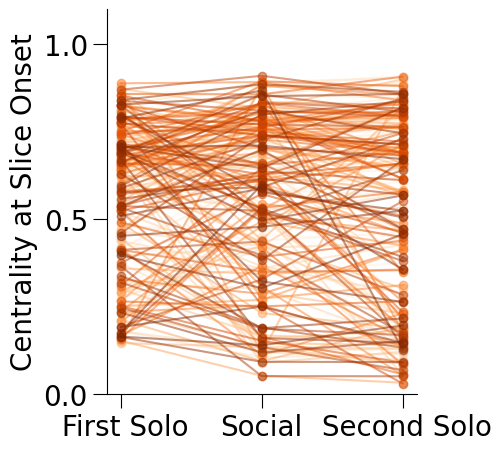

In [15]:
plt.figure(figsize=(4,5))
for i in points:
    plt.plot([0,1,2], [first_solo_centrality[i], social_centrality[i], second_solo_centrality[i]],
             marker='o', linestyle='-', color=colorpalette[i], alpha=0.5)

plt.ylabel('Centrality at Slice Onset', fontsize=20)
plt.xticks([0, 1, 2], [' First Solo', 'Social', ' Second Solo'], fontsize=20)
plt.yticks(np.arange(0, 1.1, 0.5), fontsize=20)
plt.ylim(0, 1.1)
ax = plt.gca()
ax.tick_params(length=10)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.show()

### Using pickled dfs and trial lists

In [710]:
# reading pickled dataframes pickled from trait_table.ipynb
df_socials = pd.read_pickle('/Users/benny/Documents/swc/pickled_df/df_socials.pkl')
df_solos = pd.read_pickle('/Users/benny/Documents/swc/pickled_df/df_solos.pkl')
df_first_solos = pd.read_pickle('/Users/benny/Documents/swc/pickled_df/df_first_solos.pkl')
df_second_solos = pd.read_pickle('/Users/benny/Documents/swc/pickled_df/df_second_solos.pkl')
social_lists = pd.read_pickle('/Users/benny/Documents/swc/pickled_df/social_lists.pkl')
solos_lists = pd.read_pickle('/Users/benny/Documents/swc/pickled_df/solos_lists.pkl')
first_solos_lists = pd.read_pickle('/Users/benny/Documents/swc/pickled_df/first_solos_lists.pkl')
second_solos_lists = pd.read_pickle('/Users/benny/Documents/swc/pickled_df/second_solos_lists.pkl') 

In [711]:
occupancy_dict = pd.read_pickle('/Users/benny/Documents/swc/pickled_df/occupancy_dict.pkl') 

In [712]:
# combined solos
combined_solos = []

for trial_list_idx in range(0, len(solos_lists), 2):

    # concatenate the trial lists for the 2 solos of this session
    trial_list_combined = solos_lists[trial_list_idx] + solos_lists[trial_list_idx + 1]

    combined_solos.append(trial_list_combined)

In [713]:
import trait_analyses.functions.occupancy_and_strategy as occupancy_and_strategy

### First solo-social-second solo shift in averag centrality for each player-opponent pair separately

In [714]:
import math

In [715]:
n_plots = len(pseudo_tuples_list)
n_cols = 10
n_rows = math.ceil(n_plots / n_cols)

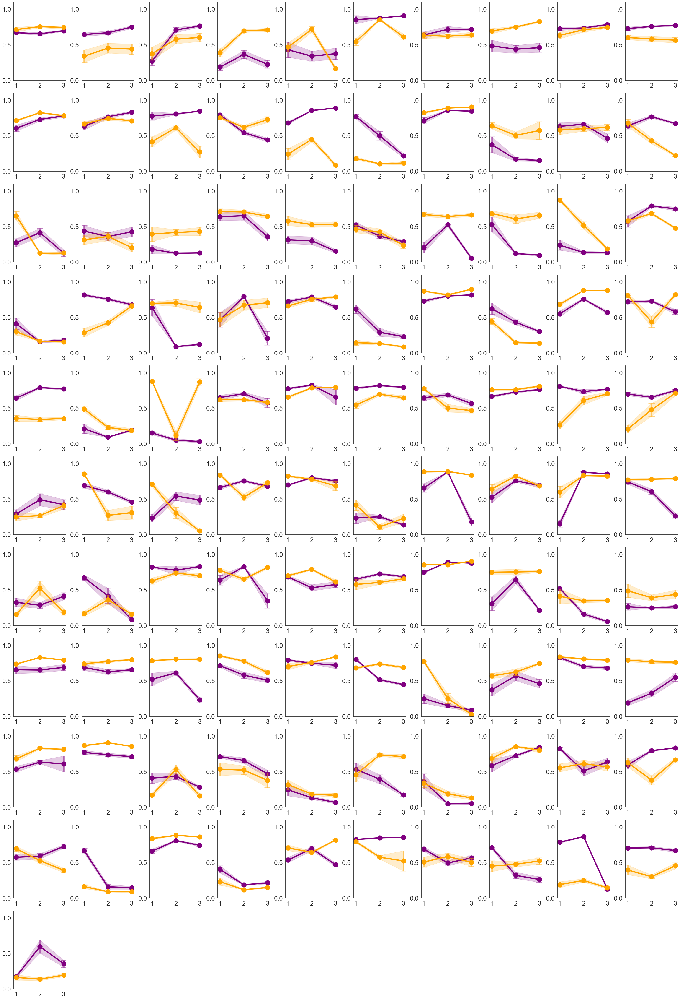

In [716]:
fig, axs = plt.subplots(
    n_rows,
    n_cols,
    figsize=(3 * n_cols, 4 * n_rows)
)

# Make axs always 2D
axs = np.atleast_2d(axs)

for i in range(n_plots):

    row = i // n_cols
    col = i % n_cols

    ax = axs[row, col]

    for j in range(2):

        pseudonym = pseudo_tuples_list[i][j]

        first_solo = occupancy_dict['first_solos']['central_tendency_at_slice_onset'][pseudonym][0]
        social = occupancy_dict['socials']['central_tendency_at_slice_onset'][pseudonym]
        second_solo = occupancy_dict['second_solos']['central_tendency_at_slice_onset'][pseudonym][0]

        first_variance = np.var(occupancy_dict['first_solos']['raw_values'][pseudonym])
        social_variance = np.var(occupancy_dict['socials']['raw_values'][pseudonym])
        second_variance = np.var(occupancy_dict['second_solos']['raw_values'][pseudonym])

        color = 'purple' if j == 0 else 'orange'

        ax.plot(
            [1,2,3],
            [first_solo, social, second_solo],
            marker='o',
            markersize=15,
            linestyle='-',
            linewidth=4,
            color=color,
            alpha=1
        )

        # add variance as shaded area around the line
        ax.fill_between(
            [1,2,3],
            [first_solo - first_variance, social - social_variance, second_solo - second_variance],
            [first_solo + first_variance, social + social_variance, second_solo + second_variance],
            color=color,
            alpha=0.2
        )

        # add error bars with top and bottom caps
        ax.errorbar(
            [1,2,3],
            [first_solo, social, second_solo],
            yerr=[first_variance, social_variance, second_variance],
            fmt='none',
            ecolor=color,
            elinewidth=5,
            alpha=0.5,
            capsize=10
        )

    ax.set_ylim(0, 1.1)
    ax.set_yticks(np.arange(0, 1.1, 0.5))
    ax.tick_params(length=5, labelsize=20)

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

# Hide unused subplots
total_axes = n_rows * n_cols

for k in range(n_plots, total_axes):

    row = k // n_cols
    col = k % n_cols

    axs[row, col].axis('off')

plt.tight_layout()
plt.show()


We need to consider:

1. the participant's centrality at the start (in the first solo) not influenced by the opponent's behaviour and if any learning happens in the solo itself (look at each timepoint)

2. the respective opponent's centrality at the start (in the first solo)

3. the progressive changes in centrality in social - do they start more or less similar? who changes more in strategy? in which direction is this change? does this change match the respective opponent's strategy? is one more static in strategy than the other or do they both change equally?

4. is there a reverting back to the original strategy in the second solo? do they stick with the strategy they had in social whether this was changed to or not?

5. how much does each player in the different strategy groups move around/turn? for example, low centrality players can differ a lot with respect to over motion

a) what is the individual's baseline 

b) is there an increase or decrease

c) who moves closer to who?

d) is there a recuperation or change in strategy in the second solo?

### Metrics:

**First solo**

***Static***

X mean centrality 

X median centrality

X variance

***Dynamic***

- linear slope across trials



**Social**

- represent dyads as coupled trajectories

- at each trial, compute the distance between strategies (convergence? who moves more? etc.)

- adaptation magnitude: for each player calculate adaptation = social_mean - baseline_mean. then compare player and opponent adaptation

- directionality of adaptation: movement_toward_other = change in distance to opponent baseline

- identify strategic phenotypes:
    high/low centrality,
    adaptive,
    rigid,
    exploratory,
    unstable,

    using: 
    baseline centrality, 
    variance,
    movement,
    turning,
    adaptation magnitude

- do some strategy types dominate interaction?
e.g., peripheral players adapt more? central players remain rigid? adaptive players induce convergence?

**Second solo**

- reversion = second_solo - baseline -> return to baseline/remains shifted/overshoots

**Behavioural dimensions**

- Spatial: centrality, occupancy maps, edge preference, interpersonal distance

- Kinematic: speed, acceleration, turning angle, angular velocity, path tortuosity

- Strategic flexibility: variance, switching frequency, entropy, adaptation slope

# Baseline features

## First solo

In [23]:
# DYNAMIC

In [717]:
n_plots = len(first_solos_lists)
n_cols = 20
n_rows = math.ceil(n_plots / n_cols)

In [718]:
pseudo_list = np.array(pseudo_tuples_list).ravel()

In [719]:
type(occupancy_dict['socials']['raw_values']['EN27'][0])

numpy.float64

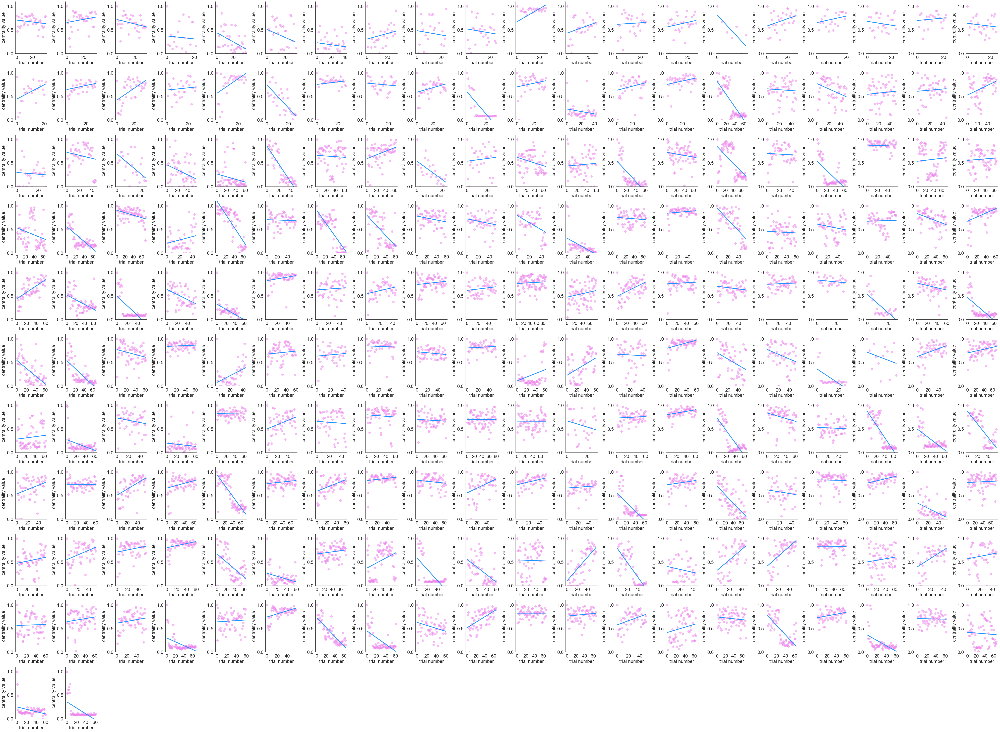

In [720]:
# scatter plots of linear slope across trials for one session

fig, axs = plt.subplots(
    n_rows,
    n_cols,
    figsize=(3 * n_cols, 4 * n_rows)
)

# Make axs always 2D
axs = np.atleast_2d(axs)

for i in range(n_plots):

    row = i // n_cols
    col = i % n_cols

    ax = axs[row, col]

    psuedonym = pseudo_list[i]

    ct_values = occupancy_dict['first_solos']['raw_values'][psuedonym][0]

    ax.scatter(range(len(ct_values)), ct_values, alpha=0.5, s=80, color='violet')
    
    ax.set_xlabel('trial number', fontsize=20)
    ax.set_ylabel('centrality value', fontsize=20)

    ax.set_xticks(np.arange(0, len(ct_values)+1, 20))
    ax.set_ylim(0, 1.1)
    ax.set_yticks(np.arange(0, 1.1, 0.5))

    ax.tick_params(length=5, labelsize=20)

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    # regression line
    xfit = np.polyfit(range(len(ct_values)), ct_values, 1)
    yfit = np.poly1d(xfit)(range(len(ct_values)))
    ax.plot(range(len(ct_values)), yfit, linewidth=3, color='dodgerblue')

# Hide unused subplots
total_axes = n_rows * n_cols

for k in range(n_plots, total_axes):

    row = k // n_cols
    col = k % n_cols

    axs[row, col].axis('off')

plt.tight_layout()
plt.show()

## Fit centrality ~ trial

In [721]:
from scipy.stats import linregress

In [722]:
baseline_rows = []

for session_idx, tuple in enumerate(pseudo_tuples_list):

    for pseudo in tuple:

        y = np.array(
            occupancy_dict['first_solos']['raw_values'][pseudo][0],
            dtype=float
        )

        x = np.arange(len(y))

        # remove NaNs if necessary
        mask = ~np.isnan(y)

        x_clean = x[mask]
        y_clean = y[mask]

        # slope
        if len(y_clean) >= 2:
            result = linregress(x_clean, y_clean)

            slope = result.slope
            intercept = result.intercept
            r_value = result.rvalue
            p_value = result.pvalue

        else:
            slope = np.nan
            intercept = np.nan
            r_value = np.nan
            p_value = np.nan

        # summary stats
        mean_ct = np.nanmean(y)
        halfpoint = np.round(len(y)/2).astype(int)
        mean_first_half = np.nanmean(y[:halfpoint])
        mean_second_half = np.nanmean(y[halfpoint::])
        var_ct = np.nanvar(y)
        std_ct = np.nanstd(y)

        baseline_rows.append({
            "session": session_idx,
            "player": pseudo,

            "baseline_mean": mean_ct,
            "baseline_mean_first_half": mean_first_half,
            "baseline_mean_second_half": mean_second_half,
            "baseline_variance": var_ct,
            "baseline_std": std_ct,

            "baseline_slope": slope,
            "baseline_intercept": intercept,

            "baseline_r": r_value,
            "baseline_p": p_value
        })

baseline_df = pd.DataFrame(baseline_rows)

In [723]:
baseline_df

,session,player,baseline_mean,baseline_mean_first_half,baseline_mean_second_half,baseline_variance,baseline_std,baseline_slope,baseline_intercept,baseline_r,baseline_p
0,0,EN27,0.672549608,0.697396845,0.647702371,0.014660950,0.121082408,-0.002018492,0.709891703,-0.182805159,0.271972319
1,0,SH27,0.716209177,0.700535987,0.732804319,0.032655828,0.180709235,0.003351112,0.659240267,0.187287471,0.281330067
2,1,AW17,0.646490261,0.686544018,0.608792607,0.024408347,0.156231711,-0.004810570,0.723459385,-0.293191381,0.097735460
3,1,SP17,0.340965825,0.340284181,0.341647469,0.087655375,0.296066505,-0.003183536,0.374392955,-0.068218703,0.762920411
4,2,FA12,0.270421505,0.355850008,0.189489239,0.060200653,0.245358213,-0.009436491,0.440278338,-0.410641031,0.011584367
...,...,...,...,...,...,...,...,...,...,...,...
197,98,RW27,0.191824630,0.264743524,0.121257959,0.040474684,0.201183210,-0.005730907,0.363751848,-0.501547989,0.000038285
198,99,MI27,0.706157598,0.706287284,0.706023727,0.015705720,0.125322466,-0.000218180,0.712921184,-0.031657868,0.805445024
199,99,YZ27,0.396952049,0.336208380,0.459536436,0.066697010,0.258257644,-0.000783564,0.422809672,-0.058675564,0.637177687
200,100,JJ30,0.176095842,0.199305733,0.153634657,0.020349482,0.142651612,-0.002486213,0.250682228,-0.306861548,0.016153441


In [724]:
def classify_slope(slope, threshold=0.002):

    if np.isnan(slope):
        return "missing"

    elif slope > threshold:
        return "increasing"

    elif slope < -threshold:
        return "decreasing"

    else:
        return "stable"


def classify_variability(std, low=0.05, high=0.15):

    if std < low:
        return "rigid"

    elif std > high:
        return "unstable"

    else:
        return "moderate"


baseline_df["trend_type"] = (
    baseline_df["baseline_slope"]
    .apply(classify_slope)
)

baseline_df["variability_type"] = (
    baseline_df["baseline_std"]
    .apply(classify_variability)
)

In [725]:
def classify_centrality(mean_ct,
                         low_thresh=0.25,
                         high_thresh=0.75):

    if mean_ct < low_thresh:
        return "low_centrality"

    elif mean_ct > high_thresh:
        return "high_centrality"

    else:
        return "mid_centrality"


baseline_df["centrality_type"] = (
    baseline_df["baseline_mean"]
    .apply(classify_centrality)
)

baseline_df["first_half_centrality_type"] = (
    baseline_df["baseline_mean_first_half"]
    .apply(classify_centrality)
)

baseline_df["second_half_centrality_type"] = (
    baseline_df["baseline_mean_second_half"]
    .apply(classify_centrality)
)

In [726]:
baseline_df["phenotype"] = (
    baseline_df["centrality_type"]
    + "_"
    + baseline_df["variability_type"]
    + "_"
    + baseline_df["trend_type"]
)

In [727]:
baseline_df

,session,player,baseline_mean,baseline_mean_first_half,baseline_mean_second_half,baseline_variance,baseline_std,baseline_slope,baseline_intercept,baseline_r,baseline_p,trend_type,variability_type,centrality_type,first_half_centrality_type,second_half_centrality_type,phenotype
0,0,EN27,0.672549608,0.697396845,0.647702371,0.014660950,0.121082408,-0.002018492,0.709891703,-0.182805159,0.271972319,decreasing,moderate,mid_centrality,mid_centrality,mid_centrality,mid_centrality_moderate_decreasing
1,0,SH27,0.716209177,0.700535987,0.732804319,0.032655828,0.180709235,0.003351112,0.659240267,0.187287471,0.281330067,increasing,unstable,mid_centrality,mid_centrality,mid_centrality,mid_centrality_unstable_increasing
2,1,AW17,0.646490261,0.686544018,0.608792607,0.024408347,0.156231711,-0.004810570,0.723459385,-0.293191381,0.097735460,decreasing,unstable,mid_centrality,mid_centrality,mid_centrality,mid_centrality_unstable_decreasing
3,1,SP17,0.340965825,0.340284181,0.341647469,0.087655375,0.296066505,-0.003183536,0.374392955,-0.068218703,0.762920411,decreasing,unstable,mid_centrality,mid_centrality,mid_centrality,mid_centrality_unstable_decreasing
4,2,FA12,0.270421505,0.355850008,0.189489239,0.060200653,0.245358213,-0.009436491,0.440278338,-0.410641031,0.011584367,decreasing,unstable,mid_centrality,mid_centrality,low_centrality,mid_centrality_unstable_decreasing
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197,98,RW27,0.191824630,0.264743524,0.121257959,0.040474684,0.201183210,-0.005730907,0.363751848,-0.501547989,0.000038285,decreasing,unstable,low_centrality,mid_centrality,low_centrality,low_centrality_unstable_decreasing
198,99,MI27,0.706157598,0.706287284,0.706023727,0.015705720,0.125322466,-0.000218180,0.712921184,-0.031657868,0.805445024,stable,moderate,mid_centrality,mid_centrality,mid_centrality,mid_centrality_moderate_stable
199,99,YZ27,0.396952049,0.336208380,0.459536436,0.066697010,0.258257644,-0.000783564,0.422809672,-0.058675564,0.637177687,stable,unstable,mid_centrality,mid_centrality,mid_centrality,mid_centrality_unstable_stable
200,100,JJ30,0.176095842,0.199305733,0.153634657,0.020349482,0.142651612,-0.002486213,0.250682228,-0.306861548,0.016153441,decreasing,moderate,low_centrality,low_centrality,low_centrality,low_centrality_moderate_decreasing


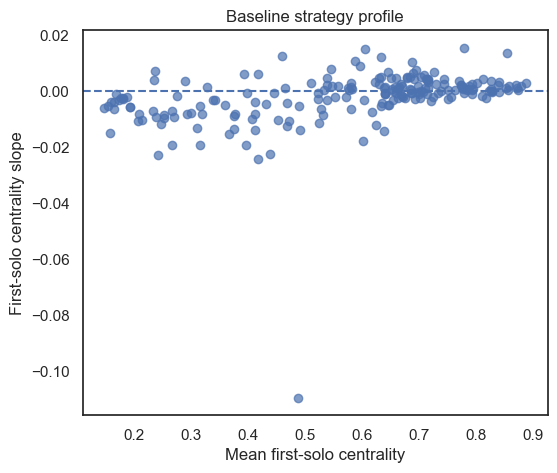

In [728]:
plt.figure(figsize=(6, 5))
plt.scatter(
    baseline_df["baseline_mean"],
    baseline_df["baseline_slope"],
    alpha=0.7
)

plt.axhline(0, linestyle="--")
plt.xlabel("Mean first-solo centrality")
plt.ylabel("First-solo centrality slope")
plt.title("Baseline strategy profile")
plt.show()

# SOCIAL

## Trial-by-trial centrality for each pair

In [729]:
social_rows = []
social_trials_centralities = {}

for session_idx, tuple in enumerate(pseudo_tuples_list):

    social_trials_centralities[session_idx] = []

    for pseudo in tuple:

        y = np.array(
            occupancy_dict['socials']['raw_values'][pseudo],
            dtype=float
        )

        x = np.arange(len(y))

        # remove NaNs if necessary
        mask = ~np.isnan(y)

        x_clean = x[mask]
        y_clean = y[mask]

        social_trials_centralities[session_idx].append(y_clean)

        # slope
        if len(y_clean) >= 2:
            result = linregress(x_clean, y_clean)

            slope = result.slope
            intercept = result.intercept
            r_value = result.rvalue
            p_value = result.pvalue

        else:
            slope = np.nan
            intercept = np.nan
            r_value = np.nan
            p_value = np.nan

        # summary stats
        mean_ct = np.nanmean(y)
        halfpoint = np.round(len(y)/2).astype(int)
        mean_first_half = np.nanmean(y[:halfpoint])
        mean_second_half = np.nanmean(y[halfpoint::])
        var_ct = np.nanvar(y)
        std_ct = np.nanstd(y)

        social_rows.append({
            "session": session_idx,
            "player": pseudo,

            "social": mean_ct,
            "social_mean_first_half": mean_first_half,
            "social_mean_second_half": mean_second_half,
            "social_variance": var_ct,
            "social_std": std_ct,

            "social_slope": slope,
            "social_intercept": intercept,

            "social_r": r_value,
            "social_p": p_value
        })

social_df = pd.DataFrame(social_rows)

In [730]:
n_plots = len(social_lists)
n_cols = 10
n_rows = math.ceil(n_plots / n_cols)

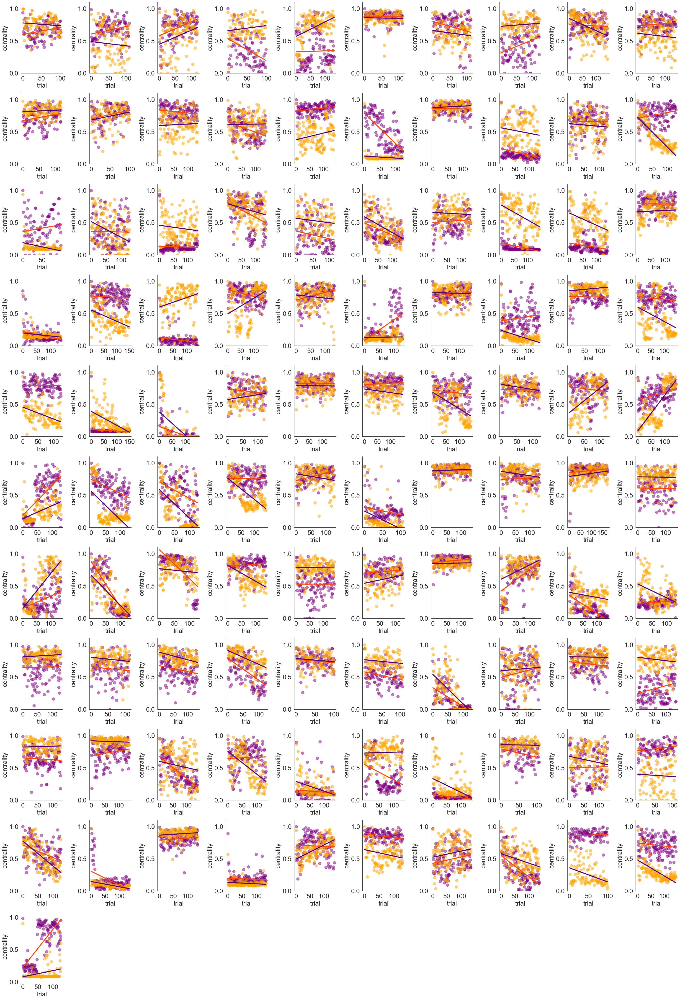

In [731]:
# scatter plots of linear slope across trials for one session

fig, axs = plt.subplots(
    n_rows,
    n_cols,
    figsize=(3 * n_cols, 4 * n_rows)
)

# Make axs always 2D
axs = np.atleast_2d(axs)

for i in range(n_plots):
    # this is 101, for each social list

    row = i // n_cols
    col = i % n_cols

    ax = axs[row, col]

    psuedonym = pseudo_list[i]

    ct_player = social_trials_centralities[i][0]
    ct_opp = social_trials_centralities[i][1]

    ax.scatter(range(len(ct_player)), ct_player, alpha=0.5, s=80, color='purple')
    ax.scatter(range(len(ct_opp)), ct_opp, alpha=0.5, s=80, color='orange')

    ax.set_xlabel('trial', fontsize=20)
    ax.set_ylabel('centrality', fontsize=20)

    ax.set_xticks(np.arange(0, len(ct_player)+1, 50))
    ax.set_ylim(0, 1.1)
    ax.set_yticks(np.arange(0, 1.1, 0.5))

    ax.tick_params(length=5, labelsize=20)

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    # regression line
    xplayer = np.polyfit(range(len(ct_player)), ct_player, 1)
    yplayer = np.poly1d(xplayer)(range(len(ct_player)))

    xopp = np.polyfit(range(len(ct_opp)), ct_opp, 1)
    yopp = np.poly1d(xopp)(range(len(ct_opp)))
    if np.isnan(xplayer[0]):
        print(f"session {i} - player x: {xplayer}, y: {yplayer}, opp x: {xopp}, y: {yopp}")
        print()

    ax.plot(range(len(ct_player)), yplayer, linewidth=3, color='orangered')
    ax.plot(range(len(ct_opp)), yopp, linewidth=3, color='indigo')

# Hide unused subplots
total_axes = n_rows * n_cols

for k in range(n_plots, total_axes):

    row = k // n_cols
    col = k % n_cols

    axs[row, col].axis('off')

plt.tight_layout()
plt.show()

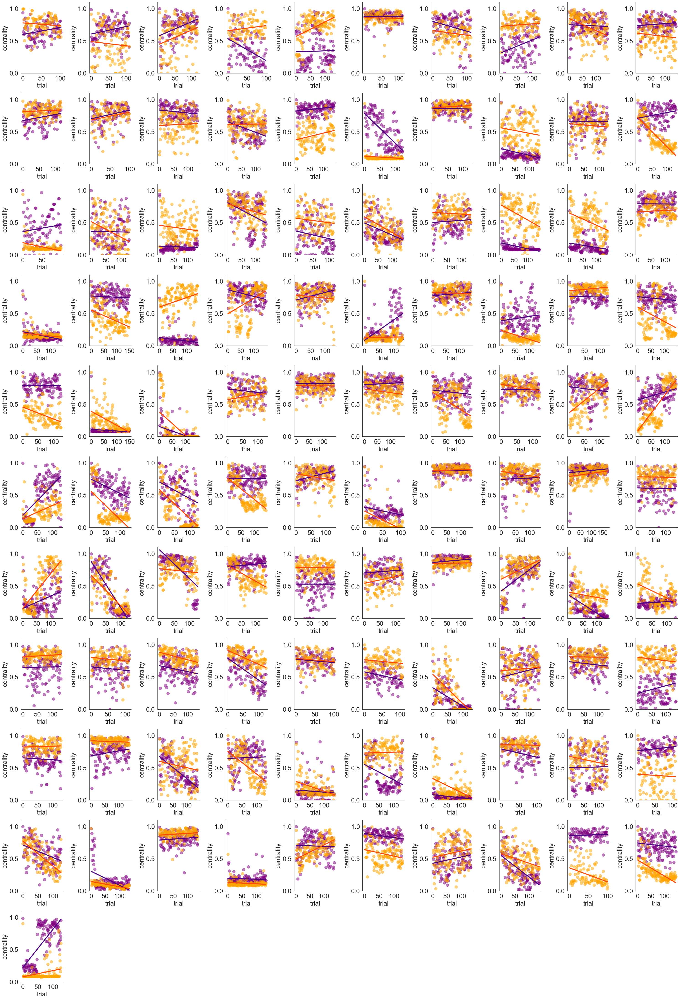

In [732]:
# scatter plots of linear slope across trials for one session

fig, axs = plt.subplots(
    n_rows,
    n_cols,
    figsize=(3 * n_cols, 4 * n_rows)
)

# Make axs always 2D
axs = np.atleast_2d(axs)

for i in range(n_plots):
    # this is 101, for each social list

    row = i // n_cols
    col = i % n_cols

    ax = axs[row, col]

    psuedonym = pseudo_list[i]

    ct_player = social_trials_centralities[i][0]
    ct_opp = social_trials_centralities[i][1]

    ax.scatter(range(len(ct_player)), ct_player, alpha=0.5, s=80, color='purple')
    ax.scatter(range(len(ct_opp)), ct_opp, alpha=0.5, s=80, color='orange')

    ax.set_xlabel('trial', fontsize=20)
    ax.set_ylabel('centrality', fontsize=20)

    ax.set_xticks(np.arange(0, len(ct_player)+1, 50))
    ax.set_ylim(0, 1.1)
    ax.set_yticks(np.arange(0, 1.1, 0.5))

    ax.tick_params(length=5, labelsize=20)

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    # regression line
    xplayer = np.polyfit(range(len(ct_player)), ct_player, 1)
    yplayer = np.poly1d(xplayer)(range(len(ct_player)))

    xopp = np.polyfit(range(len(ct_opp)), ct_opp, 1)
    yopp = np.poly1d(xopp)(range(len(ct_opp)))
    if np.isnan(xplayer[0]):
        print(f"session {i} - player x: {xplayer}, y: {yplayer}, opp x: {xopp}, y: {yopp}")
        print()

    ax.plot(range(len(ct_player)), yplayer, linewidth=3, color='indigo')
    ax.plot(range(len(ct_opp)), yopp, linewidth=3, color='orangered')

# Hide unused subplots
total_axes = n_rows * n_cols

for k in range(n_plots, total_axes):

    row = k // n_cols
    col = k % n_cols

    axs[row, col].axis('off')

plt.tight_layout()
plt.show()

# Characterising centrality shift patterns

Gradient 1 = change from first solo to social

Gradient 2 = change from social to second solo

In [733]:
def grad_state(g, cutoff):
    if g > cutoff:
        return 1
    elif g < -cutoff:
        return -1
    else:
        return 0

In [736]:
def classify_shift(first_solo, social, second_solo, cutoff=0.1):
    first_solo = np.asarray(first_solo)
    social = np.asarray(social)
    second_solo = np.asarray(second_solo)

    first_mean = np.nanmean(first_solo)
    social_mean = np.nanmean(social)
    second_mean = np.nanmean(second_solo)

    g1 = social_mean - first_mean
    g2 = second_mean - social_mean

    if abs(g1) < cutoff and abs(g2) < cutoff:
        return "NO ADAPT"

    if abs(g1) >= cutoff and abs(g2) < cutoff:
        return "SUSTAINED"

    if abs(g1) >= cutoff and abs(g2) >= cutoff and np.sign(g1) != np.sign(g2):
        return "ADAPT & REVERSE"

    if abs(g1) >= cutoff and abs(g2) >= cutoff and np.sign(g1) == np.sign(g2):
        return "CONT SHFIT"
    
    if abs(g1) < cutoff and abs(g2) >= cutoff:
        return "SHIFT POST SOCIAL"

    return "mixed"

In [734]:
# reworking above function to be more rigorous

def bootstrap_mean_diff_ci(a, b, n_boot=5000, ci=95, random_state=None):
    """
    Returns mean difference b - a and bootstrap CI.
    """
    rng = np.random.default_rng(random_state)

    a = np.asarray(a, dtype=float)
    b = np.asarray(b, dtype=float)

    a = a[~np.isnan(a)]
    b = b[~np.isnan(b)]

    if len(a) < 2 or len(b) < 2:
        return np.nan, np.nan, np.nan

    observed = np.mean(b) - np.mean(a)

    boot_diffs = np.empty(n_boot)

    for i in range(n_boot):
        a_sample = rng.choice(a, size=len(a), replace=True)
        b_sample = rng.choice(b, size=len(b), replace=True)

        boot_diffs[i] = np.mean(b_sample) - np.mean(a_sample)

    alpha = (100 - ci) / 2
    lo, hi = np.percentile(
        boot_diffs,
        [alpha, 100 - alpha]
    )

    return observed, lo, hi

In [735]:
def classify_shift_bootstrap(
    first_solo,
    social,
    second_solo,
    n_boot=5000,
    ci=95,
    random_state=None
):
    """
    Classifies changes across first solo -> social -> second solo.

    Uses bootstrap CIs for:
    g1 = social - first_solo
    g2 = second_solo - social

    A transition is considered reliable if its CI excludes 0.
    """

    g1, g1_lo, g1_hi = bootstrap_mean_diff_ci(
        first_solo,
        social,
        n_boot=n_boot,
        ci=ci,
        random_state=random_state
    )

    g2, g2_lo, g2_hi = bootstrap_mean_diff_ci(
        social,
        second_solo,
        n_boot=n_boot,
        ci=ci,
        random_state=random_state
    )

    g1_sig = (g1_lo > 0) or (g1_hi < 0)
    g2_sig = (g2_lo > 0) or (g2_hi < 0)

    if not g1_sig and not g2_sig:
        label = "NO RELIABLE SHIFT"

    elif g1_sig and not g2_sig:
        label = "SUSTAINED SHIFT"

    elif g1_sig and g2_sig and np.sign(g1) != np.sign(g2):
        label = "ADAPT & REVERSE"

    elif g1_sig and g2_sig and np.sign(g1) == np.sign(g2):
        label = "CONTINUED SHIFT"

    elif not g1_sig and g2_sig:
        label = "POST-SOCIAL SHIFT"

    else:
        label = "MIXED"

    return {
        "label": label,
        "g1_social_minus_first_solo": g1,
        "g1_ci": (g1_lo, g1_hi),
        "g1_reliable": g1_sig,
        "g2_second_solo_minus_social": g2,
        "g2_ci": (g2_lo, g2_hi),
        "g2_reliable": g2_sig,
        "ci": ci,
        "n_boot": n_boot
    }

In [40]:
def classify_coupling(g_player, g_opp, cutoff=0.1):

    if abs(g_player) < cutoff and abs(g_opp) < cutoff:
        return "stable"

    if np.sign(g_player) == -np.sign(g_opp):
        return "competitive"

    if np.sign(g_player) == np.sign(g_opp):
        return "cooperative"

    return "mixed"

In [737]:
for i in range(len(pseudo_tuples_list)):

    for j in range(2):

        pseudonym = pseudo_tuples_list[i][j]

        first_solo = occupancy_dict['first_solos']['raw_values'][pseudonym][0][1::]
        social = occupancy_dict['socials']['raw_values'][pseudonym][1::]
        second_solo = occupancy_dict['second_solos']['raw_values'][pseudonym][0][1::]

        shift = classify_shift(first_solo, social, second_solo)
        results = classify_shift_bootstrap(
            first_solo,
            social,
            second_solo
        )

In [738]:
from scipy.stats import sem

In [739]:
n_plots = len(pseudo_tuples_list)
n_cols = 10
n_rows = math.ceil(n_plots / n_cols)

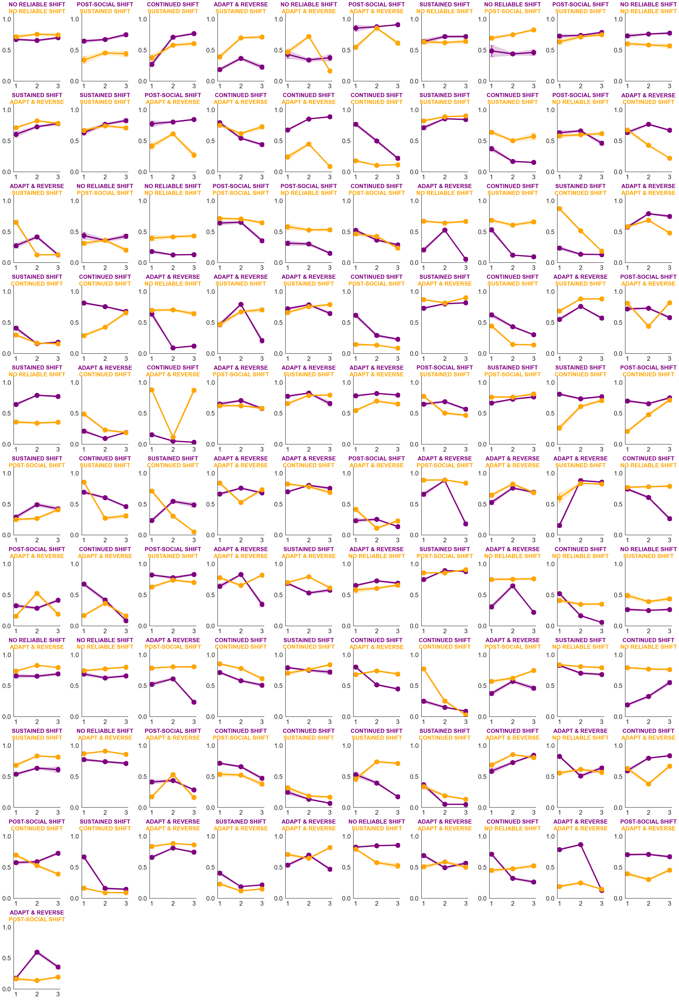

In [740]:
fig, axs = plt.subplots(
    n_rows,
    n_cols,
    figsize=(3 * n_cols, 4 * n_rows)
)

# Make axs always 2D
axs = np.atleast_2d(axs)

for i in range(n_plots):

    row = i // n_cols
    col = i % n_cols

    ax = axs[row, col]

    shift = []

    for j in range(2):

        pseudonym = pseudo_tuples_list[i][j]

        first_mean = occupancy_dict['first_solos']['central_tendency_at_slice_onset'][pseudonym][0]
        social_mean = occupancy_dict['socials']['central_tendency_at_slice_onset'][pseudonym]
        second_mean = occupancy_dict['second_solos']['central_tendency_at_slice_onset'][pseudonym][0]

        first_solo = occupancy_dict['first_solos']['raw_values'][pseudonym][0][1::]
        social = occupancy_dict['socials']['raw_values'][pseudonym][1::]
        second_solo = occupancy_dict['second_solos']['raw_values'][pseudonym][0][1::]

        first_variance = np.var(first_solo)
        social_variance = np.var(social)
        second_variance = np.var(second_solo)

        first_sem = sem(first_solo)
        social_sem = sem(social)
        second_sem = sem(second_solo)

        #shift_pseudo = classify_shift(first_solo, social, second_solo)
        results = classify_shift_bootstrap(
            first_solo,
            social,
            second_solo
        )
        #shift.append(shift_pseudo)
        shift.append(results['label'])

        color = 'purple' if j == 0 else 'orange'

        ax.plot(
            [1,2,3],
            [first_mean, social_mean, second_mean],
            marker='o',
            markersize=15,
            linestyle='-',
            linewidth=4,
            color=color,
            alpha=1
        )

        # add variance as shaded area around the line
        ax.fill_between(
            [1,2,3],
            [first_mean - first_sem, social_mean - social_sem, second_mean - second_sem],
            [first_mean + first_sem, social_mean + social_sem, second_mean + second_sem],
            color=color,
            alpha=0.2
        )

        # add error bars with top and bottom caps
        ax.errorbar(
            [1,2,3],
            [first_mean, social_mean, second_mean],
            yerr=[first_sem, social_sem, second_sem],
            fmt='none',
            ecolor=color,
            elinewidth=5,
            alpha=0.5,
            capsize=10
        )

    ax.set_title("")

    ax.text(
        0.5,
        1.08,
        shift[0],
        transform=ax.transAxes,
        ha='center',
        va='bottom',
        fontsize=18,
        color='purple',
        fontweight='bold'
    )

    ax.text(
        0.5,
        0.98,
        shift[1],
        transform=ax.transAxes,
        ha='center',
        va='bottom',
        fontsize=18,
        color='orange',
        fontweight='bold'
    )

    ax.set_ylim(0, 1.1)
    ax.set_yticks(np.arange(0, 1.1, 0.5))
    ax.tick_params(length=5, labelsize=20)

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)


# Hide unused subplots
total_axes = n_rows * n_cols

for k in range(n_plots, total_axes):

    row = k // n_cols
    col = k % n_cols

    axs[row, col].axis('off')

plt.tight_layout()
plt.show()

# Incorporating scores in analysis

Some scores appear to be nan - fixed function from player_scores below

In [742]:
import analysis.player_scores as player_scores

In [743]:
def proportion_score_sessions(social_lists):
    ''' Return num_sessions*num_players array for proportion of score
        each player earned in a session.
        Takes the data folder and a list of session filenames '''

    proportion_scores_all_sessions = np.zeros((len(social_lists), 2))
    for i in range(len(social_lists)):
        trials_list = social_lists[i]
        
        # access final trial event log event for the final player scores
        final_trial = trials_list[-1]
        final_trial_trial_end = final_trial[final_trial['eventDescription'] == 'trial end']
        
        # flexibly index player scores
        player0_score = final_trial_trial_end[globals.PLAYER_SCORE_DICT[0]['score']].item()
        player1_score = final_trial_trial_end[globals.PLAYER_SCORE_DICT[1]['score']].item()

        if np.isnan(player1_score) or np.isnan(player0_score):

            second_fin_trial = trials_list[-2]
            second_fin_trial_trial_end = second_fin_trial[second_fin_trial['eventDescription'] == 'trial end']

            player0_score = second_fin_trial_trial_end[globals.PLAYER_SCORE_DICT[0]['score']].item()
            player1_score = second_fin_trial_trial_end[globals.PLAYER_SCORE_DICT[1]['score']].item()

        total_score = player0_score + player1_score
        
        proportion_score_player0 = player0_score/total_score
        proportion_score_player1 = player1_score/total_score

        proportion_scores_all_sessions[i, 0] = proportion_score_player0
        proportion_scores_all_sessions[i, 1] = proportion_score_player1

    return proportion_scores_all_sessions

In [744]:
def proportion_score_sessions_df(trial_lists):
    ''' Return num_sessions*num_players array for proportion of score
        each player earned in a session.
        Takes a list of pre-processed trial lists '''
    
    proportion_scores_all_sessions = np.zeros((len(trial_lists), 2))
    for trial_list_index in range(len(trial_lists)):
        trial_list = trial_lists[trial_list_index]

        # access final trial event log event for the final player scores
        final_trial = trial_list[-1]
        final_trial_trial_end = final_trial[final_trial['eventDescription'] == 'trial end']
        
        # flexibly index player scores
        player0_score = final_trial_trial_end[globals.PLAYER_SCORE_DICT[0]['score']].item()
        player1_score = final_trial_trial_end[globals.PLAYER_SCORE_DICT[1]['score']].item()

        if np.isnan(player1_score) or np.isnan(player0_score):

            second_fin_trial = trial_list[-2]
            second_fin_trial_trial_end = second_fin_trial[second_fin_trial['eventDescription'] == 'trial end']

            player0_score = second_fin_trial_trial_end[globals.PLAYER_SCORE_DICT[0]['score']].item()
            player1_score = second_fin_trial_trial_end[globals.PLAYER_SCORE_DICT[1]['score']].item()

        total_score = player0_score + player1_score
        
        proportion_score_player0 = player0_score/total_score
        proportion_score_player1 = player1_score/total_score

        proportion_scores_all_sessions[trial_list_index, 0] = proportion_score_player0
        proportion_scores_all_sessions[trial_list_index, 1] = proportion_score_player1

    return proportion_scores_all_sessions

In [745]:
proportion_scores_all_sessions = proportion_score_sessions_df(social_lists)
proportion_wins_all_sessions = player_scores.proportion_wins_sessions(social_lists)

In [746]:
proportion_scores = {}
proportion_wins = {}

In [747]:
from collections import defaultdict, Counter

In [748]:
proportion_scores = defaultdict(list)
proportion_wins = defaultdict(list)

for i, pair in enumerate(pseudo_tuples_list):
    player0, player1 = pair

    proportion_scores[player0].append(proportion_scores_all_sessions[i][0])
    proportion_wins[player0].append(proportion_wins_all_sessions[i][0])

    proportion_scores[player1].append(proportion_scores_all_sessions[i][1])
    proportion_wins[player1].append(proportion_wins_all_sessions[i][1])

In [749]:
for pseudonym in trait_df.index:
    trait_df.loc[pseudonym, 'proportion_score'] = proportion_scores.get(pseudonym, np.nan)
    trait_df.loc[pseudonym, 'proportion_wins'] = proportion_wins.get(pseudonym, np.nan)

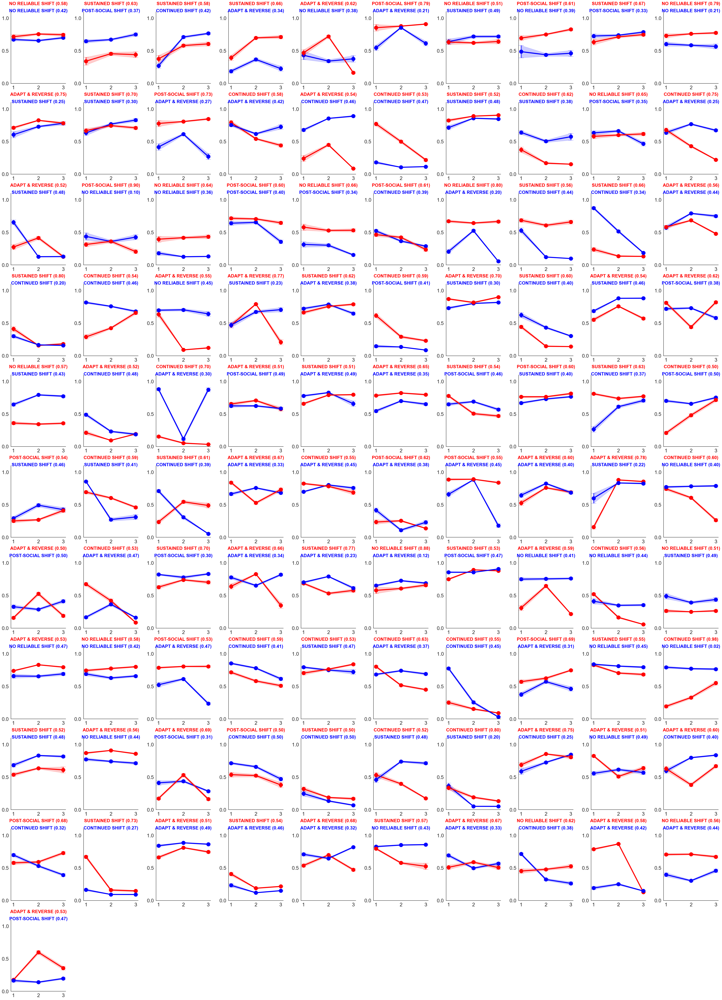

In [750]:
fig, axs = plt.subplots(
    n_rows,
    n_cols,
    figsize=(4 * n_cols, 5 * n_rows)
)

# Make axs always 2D
axs = np.atleast_2d(axs)

for i in range(n_plots):

    row = i // n_cols
    col = i % n_cols

    ax = axs[row, col]

    shift = [None, None, []]
    prop_scores = [None, None, []]

    for j in range(2):

        pseudonym = pseudo_tuples_list[i][j]

        first_mean = occupancy_dict['first_solos']['central_tendency_at_slice_onset'][pseudonym][0]
        social_mean = occupancy_dict['socials']['central_tendency_at_slice_onset'][pseudonym]
        second_mean = occupancy_dict['second_solos']['central_tendency_at_slice_onset'][pseudonym][0]

        first_solo = occupancy_dict['first_solos']['raw_values'][pseudonym][0][1::]
        social = occupancy_dict['socials']['raw_values'][pseudonym][1::]
        second_solo = occupancy_dict['second_solos']['raw_values'][pseudonym][0][1::]

        first_variance = np.var(first_solo)
        social_variance = np.var(social)
        second_variance = np.var(second_solo)

        first_sem = sem(first_solo)
        social_sem = sem(social)
        second_sem = sem(second_solo)

        #shift_pseudo = classify_shift(first_solo, social, second_solo)
        results = classify_shift_bootstrap(
            first_solo,
            social,
            second_solo
        )
        
        shift_pseudo = results['label']
        
        prop_score = trait_df.loc[pseudonym, 'proportion_score']

        opponent = trait_df.loc[pseudonym]['opponent']

        if trait_df.loc[pseudonym, 'proportion_score'] > trait_df.loc[opponent, 'proportion_score']:
            color = 'red'
            shift[0] = shift_pseudo
            prop_scores[0] = prop_score

        elif trait_df.loc[opponent, 'proportion_score'] > trait_df.loc[pseudonym, 'proportion_score']:
            color = 'blue'
            shift[1] = shift_pseudo
            prop_scores[1] = prop_score

        else:
            color = 'green'
            shift[2].append(shift_pseudo)
            prop_scores[2].append(prop_score)

        ax.plot(
            [1,2,3],
            [first_mean, social_mean, second_mean],
            marker='o',
            markersize=15,
            linestyle='-',
            linewidth=4,
            color=color,
            alpha=1
        )

        # add variance as shaded area around the line
        ax.fill_between(
            [1,2,3],
            [first_mean - first_sem, social_mean - social_sem, second_mean - second_sem],
            [first_mean + first_sem, social_mean + social_sem, second_mean + second_sem],
            color=color,
            alpha=0.2
        )

        # add error bars with top and bottom caps
        ax.errorbar(
            [1,2,3],
            [first_mean, social_mean, second_mean],
            yerr=[first_sem, social_sem, second_sem],
            fmt='none',
            ecolor=color,
            elinewidth=5,
            alpha=0.5,
            capsize=10
        )

    ax.set_title("")

    if len(shift[2]) == 0:
        ax.text(
            0.5, 1.08,
            f"{shift[0]} ({prop_scores[0]:.2f})",
            transform=ax.transAxes,
            ha='center',
            va='bottom',
            fontsize=18,
            color='red',
            fontweight='bold'
        )

        ax.text(
            0.5, 0.98,
            f"{shift[1]} ({prop_scores[1]:.2f})",
            transform=ax.transAxes,
            ha='center',
            va='bottom',
            fontsize=18,
            color='blue',
            fontweight='bold'
        )

    else:
        ax.text(
            0.5, 1.08,
            f"{shift[2][0]} ({prop_scores[2][0]:.2f})",
            transform=ax.transAxes,
            ha='center',
            va='bottom',
            fontsize=18,
            color='green',
            fontweight='bold'
        )

        ax.text(
            0.5, 0.98,
            f"{shift[2][1]} ({prop_scores[2][1]:.2f})",
            transform=ax.transAxes,
            ha='center',
            va='bottom',
            fontsize=15,
            color='green',
            fontweight='bold'
        )

    ax.set_ylim(0, 1.1)
    ax.set_yticks(np.arange(0, 1.1, 0.5))
    ax.tick_params(length=5, labelsize=20)

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)


# Hide unused subplots
total_axes = n_rows * n_cols

for k in range(n_plots, total_axes):

    row = k // n_cols
    col = k % n_cols

    axs[row, col].axis('off')

plt.tight_layout()
plt.show()

Do winners show less variability? No

In [751]:
from scipy.stats import spearmanr
import matplotlib.cm as cm

In [753]:
def mean_sliding_sd(x, window=10):

    x = np.asarray(x)

    sds = []

    for start in range(len(x) - window + 1):

        segment = x[start:start + window]

        sds.append(np.std(segment))

    return np.mean(sds)

In [756]:
from scipy.stats import linregress

def detrended_sd(x):

    x = np.asarray(x)

    t = np.arange(len(x))

    fit = linregress(t, x)

    trend = fit.intercept + fit.slope * t

    residuals = x - trend

    return np.std(residuals)

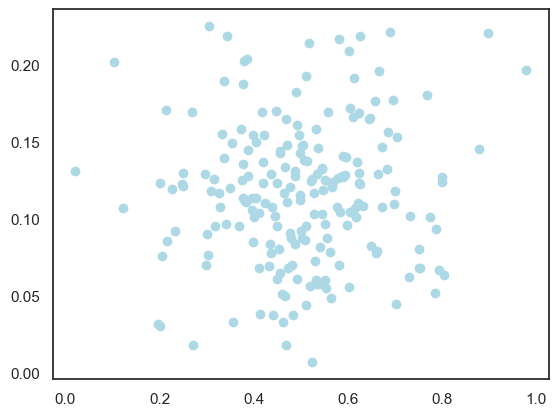

In [762]:
social_sds = []
sliding_window_sds = []
detrend_sds = []
proportion_scores = []

for i in range(len(pseudo_tuples_list)):

    for j in range(2):

        pseudonym = pseudo_tuples_list[i][j]

        social = occupancy_dict['socials']['raw_values'][pseudonym][1::]

        social_sd = np.std(social)
        sliding_window_sd = mean_sliding_sd(social, window=10)
        detrend_sd = detrended_sd(social)

        social_cv = np.std(social) / np.nanmean(social)

        proportion_score = trait_df.loc[pseudonym]['proportion_score']

        social_sds.append(social_sd)
        sliding_window_sds.append(sliding_window_sd)
        detrend_sds.append(detrend_sd)
        
        proportion_scores.append(proportion_score)

        plt.scatter(
            proportion_score,
            sliding_window_sd,
            c='lightblue',
        )

        

In [759]:
from scipy.stats import pearsonr
import seaborn as sns

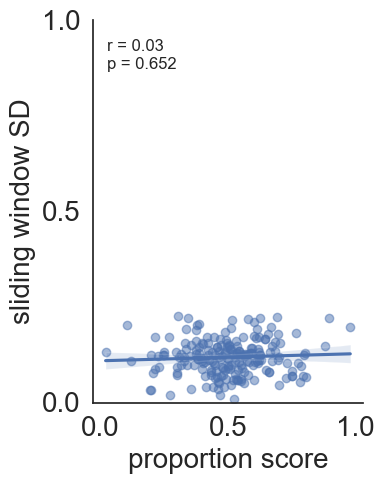

In [768]:
r, p = pearsonr(proportion_scores, social_sds)

plt.figure(figsize=(4, 5))

#sns.regplot(
    #x=proportion_scores,
    #y=social_sds,
    #scatter_kws={'alpha': 0.6, 's': 50},
    #line_kws={'lw': 2}
#)
sns.set_style("white")
sns.regplot(
    x=proportion_scores,
    y=sliding_window_sds,
    ci=95,
    scatter_kws={'alpha': 0.5}
)

plt.xlabel('proportion score', fontsize=20)
plt.ylabel('sliding window SD', fontsize=20)

plt.text(
    0.05, 0.95,
    f'r = {r:.2f}\np = {p:.3f}',
    transform=plt.gca().transAxes,
    va='top'
)

plt.yticks(np.arange(0,1.1,0.5))

ax = plt.gca()
ax.tick_params(axis='both', which='major', labelsize=20)

sns.despine()
plt.tight_layout()
plt.show()

In [769]:
rho, p = spearmanr(
            proportion_scores,
            social_sds
        )

In [770]:
print(rho, p)

0.027883069168618206 0.6936473687384552


Do losers occupy more intermediate centrality values? No

In [58]:
distances_from_mid = []
proportion_scores = []

for i in range(len(pseudo_tuples_list)):

    for j in range(2):

        pseudonym = pseudo_tuples_list[i][j]
        social_mean = occupancy_dict['socials']['central_tendency_at_slice_onset'][pseudonym]
        distance_from_mid = abs(social_mean - 0.5)
        proportion_score = trait_df.loc[pseudonym]['proportion_score']

        distances_from_mid.append(distance_from_mid)
        proportion_scores.append(proportion_score)

In [59]:
spearmanr(
    proportion_scores,
    distances_from_mid
)

SignificanceResult(statistic=np.float64(-0.04527550027262119), pvalue=np.float64(0.5222892228080047))

Do winners adapt more? No

In [60]:
gs = []
adaptation_strengths = []
proportion_scores = []

for i in range(len(pseudo_tuples_list)):

    for j in range(2):

        pseudonym = pseudo_tuples_list[i][j]

        first_mean = occupancy_dict['first_solos']['central_tendency_at_slice_onset'][pseudonym][0]
        social_mean = occupancy_dict['socials']['central_tendency_at_slice_onset'][pseudonym]

        g1 = social_mean - first_mean
        adaptation_strength = abs(g1)

        proportion_score = trait_df.loc[pseudonym]['proportion_score']


        gs.append(g1)
        adaptation_strengths.append(adaptation_strength)
        proportion_scores.append(proportion_score)

In [61]:
spearmanr(
    proportion_scores,
    adaptation_strengths
)

SignificanceResult(statistic=np.float64(0.01097400380432132), pvalue=np.float64(0.8768160776846585))

Do winners have specific adaptation categories?

In [771]:
shifts = []

for i in range(len(pseudo_tuples_list)):

    for j in range(2):

        pseudonym = pseudo_tuples_list[i][j]

        first_solo = occupancy_dict['first_solos']['raw_values'][pseudonym][0][1::]
        social = occupancy_dict['socials']['raw_values'][pseudonym][1::]
        second_solo = occupancy_dict['second_solos']['raw_values'][pseudonym][0][1::]

        #shift_pseudo = classify_shift(first_solo, social, second_solo)

        results = classify_shift_bootstrap(
            first_solo,
            social,
            second_solo
        )
        
        shift_pseudo = results['label']
        
        shifts.append(shift_pseudo)

        trait_df.loc[pseudonym,'shift_class'] = shift_pseudo


In [772]:
trait_df

,date,Session identifier,GAD_total,AQ_total,BIS_total,opponent,proportion_score,proportion_wins,scores_per_unit_time_socials,scores_per_unit_time_solos,slice_onset_centrality_social,slice_onset_centrality_solo,slice_onset_centrality_first_solo,slice_onset_centrality_second_solo,shift_class
pseudonym,,,,,,,,,,,,,,,
EN27,2024-09-27,2024-09-27_Session1_Guest_Emily,7.0,5.0,23.0,SH27,0.424063116,0.426356589,8.431171435,4.691789369,0.656107888,0.686288346,0.672549608,0.700027084,NO RELIABLE SHIFT
SH27,2024-09-27,2024-09-27_Session1_Host_Sara,1.0,9.0,15.0,EN27,0.575936884,0.573643411,5.045425426,4.853477859,0.757651756,0.730982433,0.716209177,0.745755689,NO RELIABLE SHIFT
AW17,2024-10-17,2024-10-17_Session1_Guest_Abigail,5.0,9.0,11.0,SP17,0.374384236,0.384615385,7.464550731,5.108391665,0.671235982,0.698694795,0.646490261,0.750899330,POST-SOCIAL SHIFT
SP17,2024-10-17,2024-10-17_Session1_Host_Shameer,1.0,1.0,15.0,AW17,0.625615764,0.615384615,5.407391081,3.647107819,0.454723055,0.390837698,0.340965825,0.440709571,SUSTAINED SHIFT
FA12,2024-11-12,2024-11-12_Session2_Host_Francesca,1.0,0.0,10.0,SL12,0.420091324,0.396396396,10.612635921,6.830633950,0.710813076,0.518371221,0.270421505,0.766320938,CONTINUED SHIFT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MI27,2026-03-27,2026-03-27_Session1_Host_Mariam,1.0,1.0,22.0,YZ27,0.564476886,0.549019608,10.743446498,7.123254635,0.710401107,0.688826711,0.706157598,0.671495825,POST-SOCIAL SHIFT
RW27,2026-03-27,2026-03-27_Session2_Guest_Rebecca,1.0,2.0,16.0,DT27,0.420035149,0.441379310,6.881703895,6.490427361,0.250744257,0.169072359,0.191824630,0.146320089,ADAPT & REVERSE
YZ27,2026-03-27,2026-03-27_Session1_Guest_Yixin,2.0,1.0,11.0,MI27,0.435523114,0.450980392,7.780859736,7.144363777,0.303364361,0.427028304,0.396952049,0.457104558,ADAPT & REVERSE


In [773]:
import seaborn as sns
from matplotlib import cm

/var/folders/1x/_8ffcp0j537dvfxsh4ygtrfw0000gn/T/ipykernel_64256/229744356.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('Spectral')
/var/folders/1x/_8ffcp0j537dvfxsh4ygtrfw0000gn/T/ipykernel_64256/229744356.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


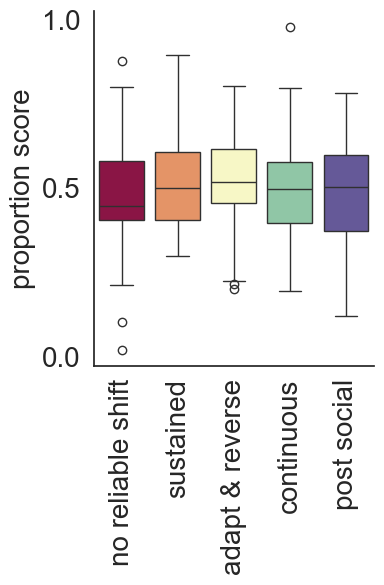

In [776]:
plt.figure(figsize=(4, 6))

cmap = cm.get_cmap('Spectral')

palette = [cmap(i) for i in np.linspace(0, 1, 5)]

sns.boxplot(
    x='shift_class',
    y='proportion_score',
    data=trait_df,
    palette=palette
)

ax = plt.gca()
ax.spines[['right', 'top']].set_visible(False)
ax.tick_params(axis='both', which='major', labelsize=20)

plt.ylabel('proportion score', fontsize=20)
plt.xlabel('')

plt.yticks(np.arange(0,1.1,0.5))
plt.xticks(
    ticks=[0, 1, 2, 3, 4],
    labels=['no reliable shift','sustained','adapt & reverse', 'continuous', 'post social'],
    rotation=90)

plt.tight_layout()
plt.show()

<Axes: xlabel='shift_class', ylabel='proportion_score'>

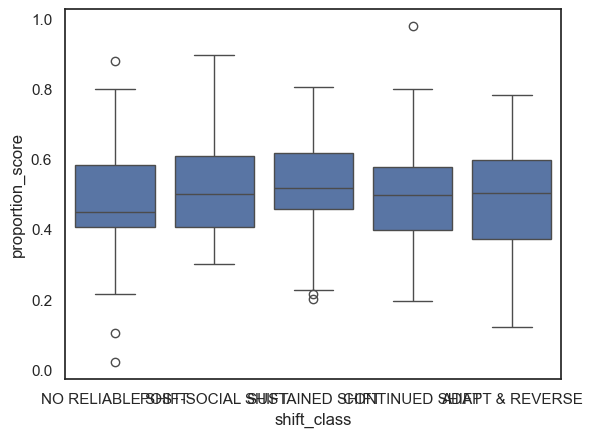

In [775]:
sns.boxplot(
    x='shift_class',
    y='proportion_score',
    data=trait_df
)

In [777]:
pd.to_pickle(trait_df, "/Users/benny/Documents/swc/trait_analyses/trait_dataframes/df1.csv")

In [778]:
trait_df

,date,Session identifier,GAD_total,AQ_total,BIS_total,opponent,proportion_score,proportion_wins,scores_per_unit_time_socials,scores_per_unit_time_solos,slice_onset_centrality_social,slice_onset_centrality_solo,slice_onset_centrality_first_solo,slice_onset_centrality_second_solo,shift_class
pseudonym,,,,,,,,,,,,,,,
EN27,2024-09-27,2024-09-27_Session1_Guest_Emily,7.0,5.0,23.0,SH27,0.424063116,0.426356589,8.431171435,4.691789369,0.656107888,0.686288346,0.672549608,0.700027084,NO RELIABLE SHIFT
SH27,2024-09-27,2024-09-27_Session1_Host_Sara,1.0,9.0,15.0,EN27,0.575936884,0.573643411,5.045425426,4.853477859,0.757651756,0.730982433,0.716209177,0.745755689,NO RELIABLE SHIFT
AW17,2024-10-17,2024-10-17_Session1_Guest_Abigail,5.0,9.0,11.0,SP17,0.374384236,0.384615385,7.464550731,5.108391665,0.671235982,0.698694795,0.646490261,0.750899330,POST-SOCIAL SHIFT
SP17,2024-10-17,2024-10-17_Session1_Host_Shameer,1.0,1.0,15.0,AW17,0.625615764,0.615384615,5.407391081,3.647107819,0.454723055,0.390837698,0.340965825,0.440709571,SUSTAINED SHIFT
FA12,2024-11-12,2024-11-12_Session2_Host_Francesca,1.0,0.0,10.0,SL12,0.420091324,0.396396396,10.612635921,6.830633950,0.710813076,0.518371221,0.270421505,0.766320938,CONTINUED SHIFT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MI27,2026-03-27,2026-03-27_Session1_Host_Mariam,1.0,1.0,22.0,YZ27,0.564476886,0.549019608,10.743446498,7.123254635,0.710401107,0.688826711,0.706157598,0.671495825,POST-SOCIAL SHIFT
RW27,2026-03-27,2026-03-27_Session2_Guest_Rebecca,1.0,2.0,16.0,DT27,0.420035149,0.441379310,6.881703895,6.490427361,0.250744257,0.169072359,0.191824630,0.146320089,ADAPT & REVERSE
YZ27,2026-03-27,2026-03-27_Session1_Guest_Yixin,2.0,1.0,11.0,MI27,0.435523114,0.450980392,7.780859736,7.144363777,0.303364361,0.427028304,0.396952049,0.457104558,ADAPT & REVERSE


# Opponent in view

Do perimeter and central players keep the opponent in view the same amount?

In [78]:
# 1. split players by strategy

# find median centrality
soc_med = np.median(trait_df['slice_onset_centrality_social'])
first_sol_med = np.median(trait_df['slice_onset_centrality_first_solo'])
second_sol_med = np.median(trait_df['slice_onset_centrality_second_solo'])

print(first_sol_med, soc_med, second_sol_med)

soc_upper = soc_med + soc_med * 0.10
soc_lower = soc_med - soc_med * 0.10

first_sol_upper = first_sol_med + first_sol_med * 0.10
first_sol_lower = first_sol_med - first_sol_med * 0.10

second_sol_upper = second_sol_med + second_sol_med * 0.10
second_sol_lower = second_sol_med - second_sol_med * 0.10

trait_df['social_strategy'] = trait_df['slice_onset_centrality_social'].apply(
    lambda x: 'high_centrality' if x > soc_upper else 'mid_centrality' if x >= soc_lower else 'low_centrality')\
    .astype('category')

trait_df['first_solo_strategy'] = trait_df['slice_onset_centrality_first_solo'].apply(
    lambda x: 'high_centrality' if x > first_sol_upper else 'mid_centrality' if x >= first_sol_lower else 'low_centrality')\
    .astype('category')

trait_df['second_solo_strategy'] = trait_df['slice_onset_centrality_second_solo'].apply(
    lambda x: 'high_centrality' if x > second_sol_upper else 'mid_centrality' if x >= second_sol_lower else 'low_centrality')\
    .astype('category')

0.6380726454945566 0.6201780663800855 0.5793142442135161


In [254]:
from sandbox.centrality import opponent_visible

In [255]:
# 2. get # proportion of timepoints that opponent is visible for each group of players

opp_visible_sessions, proportions_sessions = opponent_visible.get_other_visible_session_trial_lists(social_lists, current_fov=112)

In [258]:
# per session average of proportion of time opponent is in view
opp_visible_summary = {}
for i in range(len(proportions_sessions)):
    opp_visible_summary[i] = {}
    proportions_sessions[i]
    for j in range(2):
        mean = np.nanmean(proportions_sessions[i][j])
        var = np.nanvar(proportions_sessions[i][j])
        opp_visible_summary[i][j] = [mean, var]

In [270]:
# assign to pseudonyms

import parse_data.identify_filepaths as identify_filepaths

data_folder = '/Volumes/ogma/human_octagon/RAW/standard'

social_files, ordered_solos = identify_filepaths.get_filenames(data_folder=data_folder)

import re

pseudo_tuples_list = []
experiment_dates_socials = []
for file in social_files:
     # match the session number and the pseudonym string
    match = re.search(r'(\d+_\d)[/\\](\d{4}-\d{2}-\d{2})_(\d{2}-\d{2}-\d{2})_(.*?_.*?)_Social\.json', file)
    if not match:
        print(f"Filename does not match expected pattern: {file}")
    if match:
        session, date, time, pseudonyms = match.groups()
        pseudo_tuples = pseudonyms.split('_')[0::]
        pseudo_tuples_list.append(pseudo_tuples)
        experiment_dates_socials.append((date, pseudo_tuples))

In [279]:
opponent_visible_pseudo_dict = {
    'mean': {},
    'variance': {},
}

for i, tuple in enumerate(pseudo_tuples_list):
    player0 = tuple[0]
    player1 = tuple[1]

    opponent_visible_pseudo_dict['mean'][player0] = opp_visible_summary[i][0][0]
    opponent_visible_pseudo_dict['mean'][player1] = opp_visible_summary[i][1][0]

    opponent_visible_pseudo_dict['variance'][player0] = opp_visible_summary[i][0][1]
    opponent_visible_pseudo_dict['variance'][player1] = opp_visible_summary[i][1][1]

In [281]:
for pseudonym in trait_df.index:
    trait_df.loc[pseudonym, 'opp_visible_mean'] = opponent_visible_pseudo_dict['mean'].get(pseudonym, np.nan)
    trait_df.loc[pseudonym, 'opp_visible_variance'] = opponent_visible_pseudo_dict['variance'].get(pseudonym, np.nan)

In [ ]:
# 3. statistically compare the two

In [311]:
# a) does continuous centrality predict opponent visibility?

from scipy.stats import spearmanr

r_social, p_social = spearmanr(
    trait_df["slice_onset_centrality_social"],
    trait_df["opp_visible_mean"]
)

r_first_solo, p_first_solo = spearmanr(
    trait_df["slice_onset_centrality_first_solo"],
    trait_df["opp_visible_mean"]
)

r_second_solo, p_second_solo = spearmanr(
    trait_df["slice_onset_centrality_second_solo"],
    trait_df["opp_visible_mean"]
)


print(f"Social results: {r_social:.4f}, {p_social:.4f}, First solo results: {r_first_solo:.4f}, {p_first_solo:.4f}, Second solo results: {r_second_solo:.4f}, {p_second_solo:.4f}")

Social results: -0.6718, 0.0000, First solo results: -0.4675, 0.0000, Second solo results: -0.5730, 0.0000


In [ ]:
# b) do discrete strategy groups differ in opponent visibility

from scipy.stats import kruskal

low = trait_df.loc[
    trait_df.social_strategy == "low_centrality",
    "opp_visible_mean"
].dropna()

mid = trait_df.loc[
    trait_df.social_strategy == "mid_centrality",
    "opp_visible_mean"
].dropna()

high = trait_df.loc[
    trait_df.social_strategy == "high_centrality",
    "opp_visible_mean"
].dropna()

H, p = kruskal(low, mid, high)

print(f"H = {H:.3f}, p = {p:.4f}")

H = 89.641, p = 0.0000


In [312]:
import matplotlib.pyplot as plt
import seaborn as sns

In [347]:
sns.set_style(style=None)

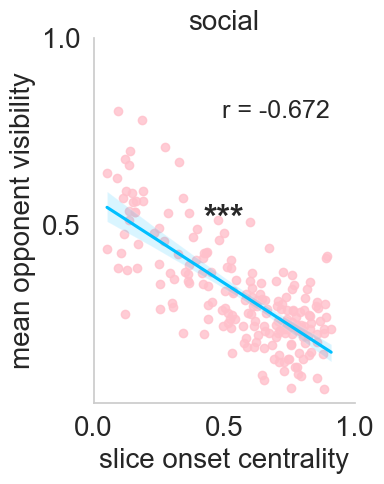

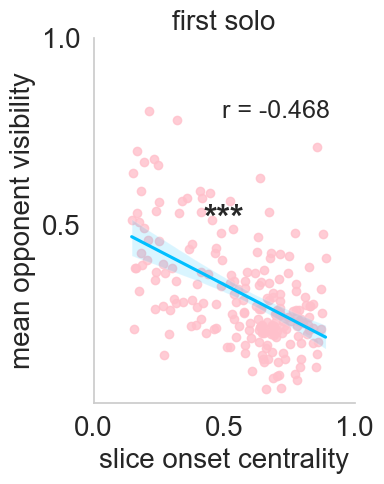

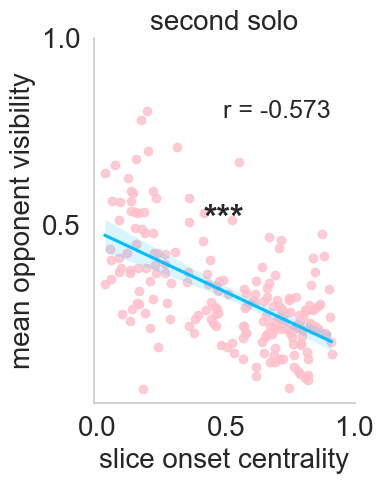

In [ ]:
# plotting

# ---------- a) Continuous centrality plots ----------

centrality_cols = {
    "social": "slice_onset_centrality_social",
    "first solo": "slice_onset_centrality_first_solo",
    "second solo": "slice_onset_centrality_second_solo"
}

for label, col in centrality_cols.items():

    df_plot = trait_df[[col, "opp_visible_mean"]].dropna()

    r, p = spearmanr(df_plot[col], df_plot["opp_visible_mean"])

    plt.figure(figsize=(4, 5))

    sns.regplot(
        data=df_plot,
        x=col,
        y="opp_visible_mean",
        scatter_kws={"color": "pink", "alpha": 0.8},
        line_kws={"color": "deepskyblue"}
    )

    ax = plt.gca()
    ax.spines[['right', 'top']].set_visible(False)

    plt.grid(False)

    if p < 0.0001:
        p_title = "***"

    ax.set_title(f"{label}", fontsize=20)

    ax.text(0.7, 0.8, f"r = {r:.3f}", horizontalalignment='center',
     verticalalignment='center', transform=ax.transAxes, fontsize=18)
    
    ax.text(0.5, 0.5, f"{p_title}", horizontalalignment='center',
     verticalalignment='center', transform=ax.transAxes, fontsize=25, fontweight='bold')
    
    plt.xlabel("slice onset centrality", fontsize=20)
    plt.ylabel("mean opponent visibility", fontsize=20)

    ax.set_yticks(np.arange(0.5, 1.1, 0.5))
    ax.set_xticks(np.arange(0, 1.1, 0.5))
    ax.tick_params(axis='both', which='major', labelsize=20)

    plt.tight_layout()
    plt.show()

In [403]:
from scipy.stats import mannwhitneyu

In [411]:
# low vs mid
u_lm, p_lm = mannwhitneyu(low, mid, alternative="two-sided")

if p_lm < 0.001:
    p_text_lm = "***"
elif p_lm < 0.01:
    p_text_lm = "**"
elif p_lm < 0.05:
    p_text_lm = "*"
else:
    p_text_lm = "ns"

# low vs high
u_lh, p_lh = mannwhitneyu(low, high, alternative="two-sided")

if p_lh < 0.001:
    p_text_lh = "***"
elif p_lh < 0.01:
    p_text_lh = "**"
elif p_lh < 0.05:
    p_text_lh = "*"
else:
    p_text_lh = "ns"

# mid vs high
u_mh, p_mh = mannwhitneyu(mid, high, alternative="two-sided")

if p_mh < 0.001:
    p_text_mh = "***"
elif p_mh < 0.01:
    p_text_mh = "**"
elif p_mh < 0.05:
    p_text_mh = "*"
else:
    p_text_mh = "ns"

In [410]:
print(f"{p_mh:.4f}")

0.0228


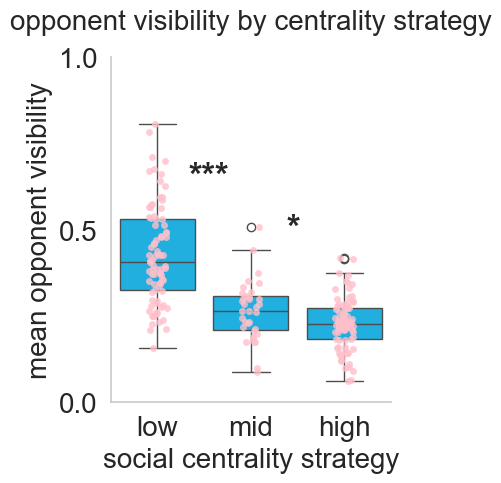

In [428]:
# ---------- b) Strategy group plot ----------

df_strategy = trait_df[
    ["social_strategy", "opp_visible_mean"]
].dropna()

order = ["low_centrality", "mid_centrality", "high_centrality"]

plt.figure(figsize=(4, 5))

ax = plt.gca()
ax.spines[['right', 'top']].set_visible(False)

plt.grid(False)

sns.boxplot(
    data=df_strategy,
    x="social_strategy",
    y="opp_visible_mean",
    order=order,
    color="deepskyblue"
)

sns.stripplot(
    data=df_strategy,
    x="social_strategy",
    y="opp_visible_mean",
    order=order,
    color="pink",
    alpha=0.8,
    jitter=True
)

plt.title("opponent visibility by centrality strategy", fontsize=20, pad=20)

#\nKruskal-Wallis H={H:.3f}, p={p:.4f}"

plt.xlabel("social centrality strategy", fontsize=20)
plt.ylabel("mean opponent visibility", fontsize=20)

plt.ylim(0, 1)
plt.xticks(
    ticks=[0, 1, 2],
    labels=["low", "mid", "high"]
)
plt.yticks(np.arange(0,1.1,0.5))

ax.tick_params(axis='both', which='major', labelsize=20)

ax.text(0.65, 0.5, f"{p_text_mh}", horizontalalignment='center',
     verticalalignment='center', transform=ax.transAxes, fontsize=25, fontweight='bold')

ax.text(0.35, 0.65, f"{p_text_lm}", horizontalalignment='center',
     verticalalignment='center', transform=ax.transAxes, fontsize=25, fontweight='bold')

plt.tight_layout()
plt.show()

### Colour trial trajectory by whether opponent is visible or not

### Does opponent visibility relate to traits?

Reminder: mean opponent visibility corresponds to the proportion of timepoints in each trial that the opponent is kept in fov, averaged across all social trials for that player

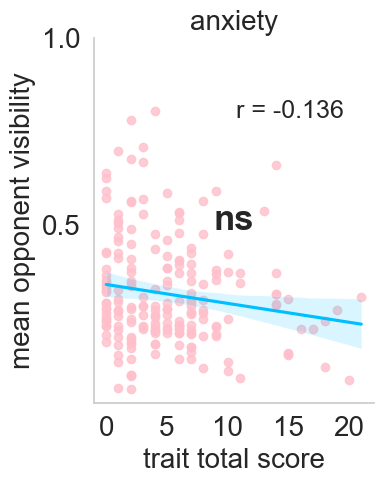

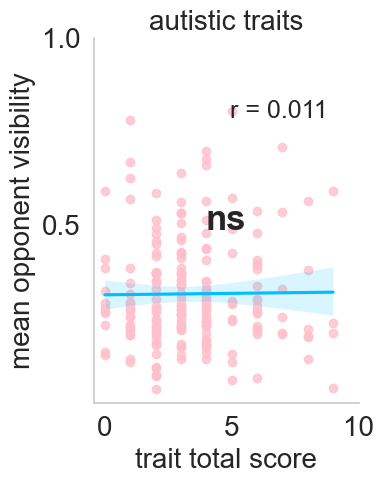

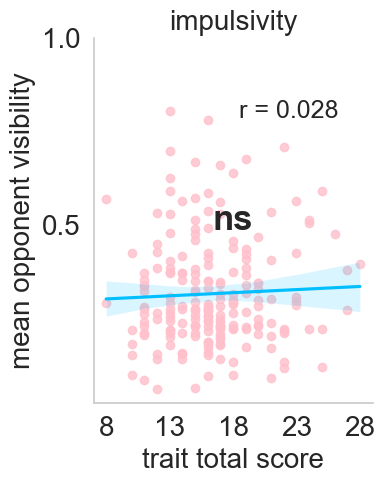

In [450]:
# plotting

# ---------- a) Continuous trait plots ----------

trait_cols = {
    "anxiety": "GAD_total",
    "autistic traits": "AQ_total",
    "impulsivity": "BIS_total"
}

for label, col in trait_cols.items():

    df_plot = trait_df[[col, "opp_visible_mean"]].dropna()

    r, p = spearmanr(df_plot[col], df_plot["opp_visible_mean"])

    plt.figure(figsize=(4, 5))

    sns.regplot(
        data=df_plot,
        x=col,
        y="opp_visible_mean",
        scatter_kws={"color": "pink", "alpha": 0.8},
        line_kws={"color": "deepskyblue"}
    )

    ax = plt.gca()
    ax.spines[['right', 'top']].set_visible(False)

    plt.grid(False)

    if p < 0.001:
        p_title = "***"
    elif p < 0.01:
        p_title = "**"
    elif p < 0.05:
        p_title = "*"
    else:
        p_title = "ns"

    ax.set_title(f"{label}", fontsize=20)

    ax.text(0.7, 0.8, f"r = {r:.3f}", horizontalalignment='center',
     verticalalignment='center', transform=ax.transAxes, fontsize=18)
    
    ax.text(0.5, 0.5, f"{p_title}", horizontalalignment='center',
     verticalalignment='center', transform=ax.transAxes, fontsize=25, fontweight='bold')
    
    plt.xlabel("trait total score", fontsize=20)
    plt.ylabel("mean opponent visibility", fontsize=20)

    ax.set_yticks(np.arange(0.5, 1.1, 0.5))
    ax.set_xticks(np.arange(min(trait_df[col]), max(trait_df[col])+3, 5))
    ax.tick_params(axis='both', which='major', labelsize=20)

    plt.tight_layout()
    plt.show()

### Head angle at slice onset for peripheral and central players

In [451]:
# take vector from player to arena centra
# take player head angle vector at slice onset
# take cosine of the angle between the two vectors
# if cosine similarity is between 0 and 1, the player is looking into the arena or along the walls on the player's side
# compute measure for how aligned the player is to the centre maybe???

In [485]:
from utils import cosine_similarity

In [487]:
arena_centre = (0,0)
thetas = {}
cosine_sims = {}

for trial_list_index, trial_list in enumerate(social_lists):

    thetas[trial_list_index] = {}
    cosine_sims[trial_list_index] = {}

    for player_id in range(2):
        
        thetas_list = []
        cosine_sims_list = []

        for trial_index, trial in enumerate(trial_list):
                
                # 1. get head angle vector at slice onset

                # slice_onset_head_angles is of len(trial_lists)
                # and contains for each player_id a list of head angle vectors
                # at slice onset for every trial
                head_angle_vectors = opponent_visible.get_player_headangle_vectors(player_id=player_id, trial=trial)
                
                # 2. get vector from player to arena centre at slice onset
                positions = opponent_visible.get_player_positions(player_id=player_id, trial=trial)

                if len(head_angle_vectors) == 0:
                    thetas_list.append(np.nan)

                else:
                    slice_onset_head_angle_vector = head_angle_vectors[0]                    
                    slice_onset_position = positions[0]
                    player_arena_vector = arena_centre - slice_onset_position

                    # 3. find vector norms and dot products, then compute cosine similarity between vectors
                    # 3a) dot product
                    dot_product_vectors = np.dot(slice_onset_head_angle_vector, player_arena_vector)
                    # 3b) vector norms
                    head_angle_vector_norm = np.linalg.norm(slice_onset_head_angle_vector)
                    player_arena_vector_norm = np.linalg.norm(player_arena_vector)
                    # 3c) cosine similarity between vectors
                    vector_cosine_similarity = cosine_similarity.calculate_cosine_similarity_two_vectors(dot_product_vectors,
                                                                                                         head_angle_vector_norm,
                                                                                                         player_arena_vector_norm)
                    theta = cosine_similarity.calculate_angle_from_cosine_similarity(vector_cosine_similarity)
                    thetas_list.append(theta)
                    cosine_sims_list.append(vector_cosine_similarity)
        
        thetas[trial_list_index][player_id] = thetas_list
        cosine_sims[trial_list_index][player_id] = cosine_sims_list
                    

/Users/benny/Repos/octagon_analysis/utils/cosine_similarity.py:9: RuntimeWarning: invalid value encountered in scalar divide
  cosine_similarity = dot_product/(vector_1_norm * vector_2_norm)
/Users/benny/Repos/octagon_analysis/utils/cosine_similarity.py:9: RuntimeWarning: invalid value encountered in scalar divide
  cosine_similarity = dot_product/(vector_1_norm * vector_2_norm)
/Users/benny/Repos/octagon_analysis/utils/cosine_similarity.py:9: RuntimeWarning: invalid value encountered in scalar divide
  cosine_similarity = dot_product/(vector_1_norm * vector_2_norm)
/Users/benny/Repos/octagon_analysis/utils/cosine_similarity.py:9: RuntimeWarning: invalid value encountered in scalar divide
  cosine_similarity = dot_product/(vector_1_norm * vector_2_norm)
/Users/benny/Repos/octagon_analysis/utils/cosine_similarity.py:9: RuntimeWarning: invalid value encountered in scalar divide
  cosine_similarity = dot_product/(vector_1_norm * vector_2_norm)
/Users/benny/Repos/octagon_analysis/utils/cos

In [546]:
d, an, bn, v

(np.int64(0), np.float64(0.0), np.float64(1.4142135623730951), np.float64(nan))

In [492]:
# per session average of head angle vector and player vector to centre alignment
cosine_sim_summary = {}
for i in range(len(cosine_sims)):
    cosine_sim_summary[i] = {}
    cosine_sims[i]
    for j in range(2):
        mean = np.nanmean(cosine_sims[i][j])
        var = np.nanvar(cosine_sims[i][j])
        cosine_sim_summary[i][j] = [mean, var]

In [494]:
cosine_sim_pseudo_dict = {
    'mean': {},
    'variance': {},
}

for i, tuple in enumerate(pseudo_tuples_list):
    player0 = tuple[0]
    player1 = tuple[1]

    cosine_sim_pseudo_dict['mean'][player0] = cosine_sim_summary[i][0][0]
    cosine_sim_pseudo_dict['mean'][player1] = cosine_sim_summary[i][1][0]

    cosine_sim_pseudo_dict['variance'][player0] = cosine_sim_summary[i][0][1]
    cosine_sim_pseudo_dict['variance'][player1] = cosine_sim_summary[i][1][1]

In [495]:
for pseudonym in trait_df.index:
    trait_df.loc[pseudonym, 'alignment_to_centre_mean'] = cosine_sim_pseudo_dict['mean'].get(pseudonym, np.nan)
    trait_df.loc[pseudonym, 'alignment_to_centre_variance'] = cosine_sim_pseudo_dict['variance'].get(pseudonym, np.nan)

In [502]:
a = trait_df[trait_df['social_strategy']=="low_centrality"]['alignment_to_centre_mean']
b = trait_df[trait_df['social_strategy']=="high_centrality"]['alignment_to_centre_mean']

In [503]:
np.max(a), np.min(a), np.max(b), np.min(b)

(np.float64(0.8987843301096442),
 np.float64(-0.3261319844461468),
 np.float64(0.0735105964591011),
 np.float64(-0.6707801227389655))

In [511]:
# b) do discrete strategy groups differ in opponent visibility

from scipy.stats import kruskal

low = trait_df.loc[
    trait_df.social_strategy == "low_centrality",
    "alignment_to_centre_mean"
].dropna()

mid = trait_df.loc[
    trait_df.social_strategy == "mid_centrality",
    "alignment_to_centre_mean"
].dropna()

high = trait_df.loc[
    trait_df.social_strategy == "high_centrality",
    "alignment_to_centre_mean"
].dropna()

H, p = kruskal(low, mid, high)

print(f"H = {H:.3f}, p = {p:.4f}")

H = 126.895, p = 0.0000


In [512]:
# low vs mid
u_lm, p_lm = mannwhitneyu(low, mid, alternative="two-sided")

if p_lm < 0.001:
    p_text_lm = "***"
elif p_lm < 0.01:
    p_text_lm = "**"
elif p_lm < 0.05:
    p_text_lm = "*"
else:
    p_text_lm = "ns"

# low vs high
u_lh, p_lh = mannwhitneyu(low, high, alternative="two-sided")

if p_lh < 0.001:
    p_text_lh = "***"
elif p_lh < 0.01:
    p_text_lh = "**"
elif p_lh < 0.05:
    p_text_lh = "*"
else:
    p_text_lh = "ns"

# mid vs high
u_mh, p_mh = mannwhitneyu(mid, high, alternative="two-sided")

if p_mh < 0.001:
    p_text_mh = "***"
elif p_mh < 0.01:
    p_text_mh = "**"
elif p_mh < 0.05:
    p_text_mh = "*"
else:
    p_text_mh = "ns"

In [525]:
print(p_text_lm,p_text_lh,p_text_mh)

*** *** ***


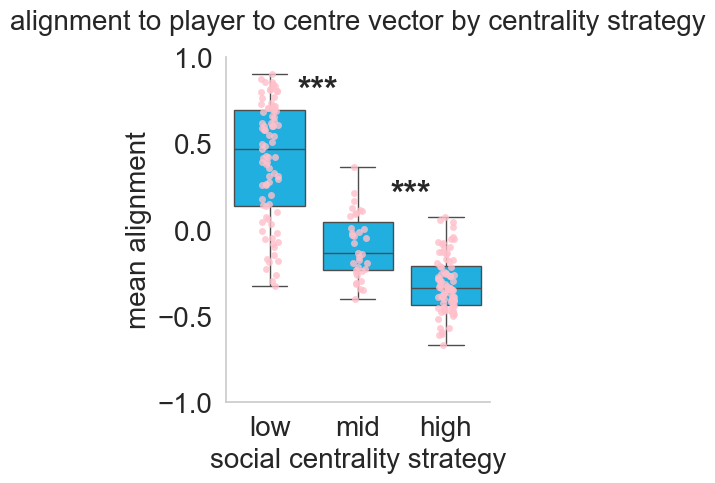

In [523]:
# ---------- b) Strategy group plot ----------

df_strategy = trait_df[
    ["social_strategy", "alignment_to_centre_mean"]
].dropna()

order = ["low_centrality", "mid_centrality", "high_centrality"]

plt.figure(figsize=(4, 5))

ax = plt.gca()
ax.spines[['right', 'top']].set_visible(False)

plt.grid(False)

sns.boxplot(
    data=df_strategy,
    x="social_strategy",
    y="alignment_to_centre_mean",
    order=order,
    color="deepskyblue"
)

sns.stripplot(
    data=df_strategy,
    x="social_strategy",
    y="alignment_to_centre_mean",
    order=order,
    color="pink",
    alpha=0.8,
    jitter=True
)

plt.title("alignment to player to centre vector by centrality strategy", fontsize=20, pad=20)

#\nKruskal-Wallis H={H:.3f}, p={p:.4f}"

plt.xlabel("social centrality strategy", fontsize=20)
plt.ylabel("mean alignment", fontsize=20)

plt.ylim(0, 1)
plt.xticks(
    ticks=[0, 1, 2],
    labels=["low", "mid", "high"]
)
plt.yticks(np.arange(-1,1.1,0.5))

ax.tick_params(axis='both', which='major', labelsize=20)

ax.text(0.7, 0.6, f"{p_text_mh}", horizontalalignment='center',
     verticalalignment='center', transform=ax.transAxes, fontsize=25, fontweight='bold')

ax.text(0.35, 0.9, f"{p_text_lm}", horizontalalignment='center',
     verticalalignment='center', transform=ax.transAxes, fontsize=25, fontweight='bold')

plt.tight_layout()
plt.show()

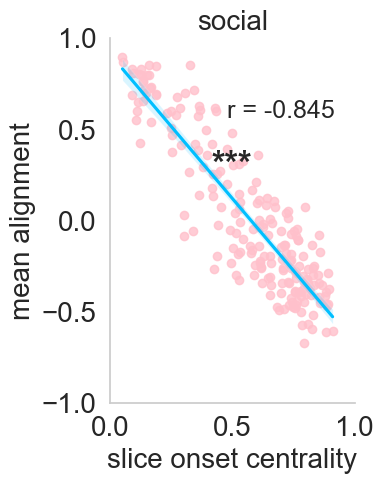

In [533]:
# plotting

# ---------- a) Continuous centrality plots ----------

centrality_cols = {
    "social": "slice_onset_centrality_social",
    #"first solo": "slice_onset_centrality_first_solo",
    #"second solo": "slice_onset_centrality_second_solo"
}

for label, col in centrality_cols.items():

    df_plot = trait_df[[col, "alignment_to_centre_mean"]].dropna()

    r, p = spearmanr(df_plot[col], df_plot["alignment_to_centre_mean"])

    plt.figure(figsize=(4, 5))

    sns.regplot(
        data=df_plot,
        x=col,
        y="alignment_to_centre_mean",
        scatter_kws={"color": "pink", "alpha": 0.8},
        line_kws={"color": "deepskyblue"}
    )

    ax = plt.gca()
    ax.spines[['right', 'top']].set_visible(False)

    plt.grid(False)

    if p < 0.001:
        p_title = "***"
    elif p < 0.01:
        p_title = "**"
    elif p < 0.01:
        p_title = "*"
    else:
        p_title = "ns"

    ax.set_title(f"{label}", fontsize=20)

    ax.text(0.7, 0.8, f"r = {r:.3f}", horizontalalignment='center',
     verticalalignment='center', transform=ax.transAxes, fontsize=18)
    
    ax.text(0.5, 0.65, f"{p_title}", horizontalalignment='center',
     verticalalignment='center', transform=ax.transAxes, fontsize=25, fontweight='bold')
    
    plt.xlabel("slice onset centrality", fontsize=20)
    plt.ylabel("mean alignment", fontsize=20)

    ax.set_yticks(np.arange(-1, 1.1, 0.5))
    ax.set_xticks(np.arange(0, 1.1, 0.5))

    ax.tick_params(axis='both', which='major', labelsize=20)

    plt.tight_layout()
    plt.show()